In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
test = pd.read_csv('training_set.csv')
test_meta = pd.read_csv('training_set_metadata.csv')
print(test_meta.columns.values)

['object_id' 'ra' 'decl' 'gal_l' 'gal_b' 'ddf' 'hostgal_specz'
 'hostgal_photoz' 'hostgal_photoz_err' 'distmod' 'mwebv' 'target']


In [3]:
test.columns.values
test = pd.merge(test, test_meta, on ='object_id')

In [ ]:
# Group object by object_id 
# grouped = test.groupby(['object_id', 'passband'])
grouped = test.groupby(['object_id'])

# Plot the objects in individual subplots (3 col by x rows)
ncols = 2
nrows = int(np.ceil(grouped.ngroups/ncols))

fig, axes = plt.subplots(nrows= nrows, ncols = ncols
                         , figsize = (12, 5* nrows)
                             ,sharey=False)
for (key, ax) in zip(grouped.groups.keys(), axes.flatten()):
    grouped.get_group(key).groupby('passband').plot(x = 'mjd', y = 'flux'
                                                    , ax = ax, style ='-o')
    ax.set_title('id:%0.0f'%(key))
    ax.legend()
#     grouped.get_group(key).plot(x = 'mjd', y = 'flux', ax = ax, style ='-')

plt.show()

In [83]:
test

,object_id,mjd,passband,flux,flux_err,detected,ra,decl,gal_l,gal_b,ddf,hostgal_specz,hostgal_photoz,hostgal_photoz_err,distmod,mwebv,target
0,615,59750.4229,2,-544.810303,3.622952,1,349.046051,-61.943836,320.79653,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
1,615,59750.4306,1,-816.434326,5.553370,1,349.046051,-61.943836,320.79653,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
2,615,59750.4383,3,-471.385529,3.801213,1,349.046051,-61.943836,320.79653,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
3,615,59750.4450,4,-388.984985,11.395031,1,349.046051,-61.943836,320.79653,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
4,615,59752.4070,2,-681.858887,4.041204,1,349.046051,-61.943836,320.79653,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
5,615,59752.4147,1,-1061.457031,6.472994,1,349.046051,-61.943836,320.79653,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
6,615,59752.4224,3,-524.954590,3.552751,1,349.046051,-61.943836,320.79653,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
7,615,59752.4334,4,-393.480225,3.599346,1,349.046051,-61.943836,320.79653,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
8,615,59752.4435,5,-355.886780,10.421921,1,349.046051,-61.943836,320.79653,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
9,615,59767.2968,2,-548.013550,3.462291,1,349.046051,-61.943836,320.79653,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92


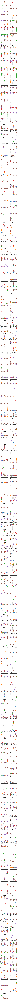

In [9]:
# Group object by classification Target id 
# grouped = test.groupby(['object_id', 'passband'])
grouped = test[0:100000].groupby(['target','object_id'])

# Plot the objects in individual subplots (3 col by x rows)
ncols = 2
nrows = int(np.ceil(grouped.ngroups/ncols))

fig, axes = plt.subplots(nrows= nrows, ncols = ncols
                         , figsize = (12, 5* nrows)
                             ,sharey=False)
for (key, ax) in zip(grouped.groups.keys(), axes.flatten()):
    grouped.get_group(key).groupby('passband').plot(x = 'mjd', y = 'flux'
                                                    , ax = ax, style ='-o')
    ax.set_title('class: %0.0f,id:%0.0f'%(key[0], key[1]))
    ax.legend()
#     grouped.get_group(key).plot(x = 'mjd', y = 'flux', ax = ax, style ='-')

plt.show()